Using Pytorch to train a GAN that can generate hand-written images of digits (0-9). This notebook is the graded assignment from Coursera Specialization "Generative Adversarial Networks (GANs)".
1. First we have to build Generator and Discriminator of a GAN from scratch. 
2. Create Generator and Discriminator loss functions
3. Combine to train GAN and visualize the generated images

Import some useful packages and the MNIST dataset:

In [2]:
import torch
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

C:\Anaconda\envs\notebook\lib\site-packages\torchvision\io\image.py:11: UserWarning: Failed to load image Python extension: Could not find module 'C:\Anaconda\envs\notebook\Lib\site-packages\torchvision\image.pyd' (or one of its dependencies). Try using the full path with constructor syntax.
  warn(f"Failed to load image Python extension: {e}")


A helper function to show tensor images:

In [3]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

### MNIST dataset

To train images the Discriminator will use the MNIST dataset. It contains 60,000 images of handwritten digits, from 0 to 9, like these:
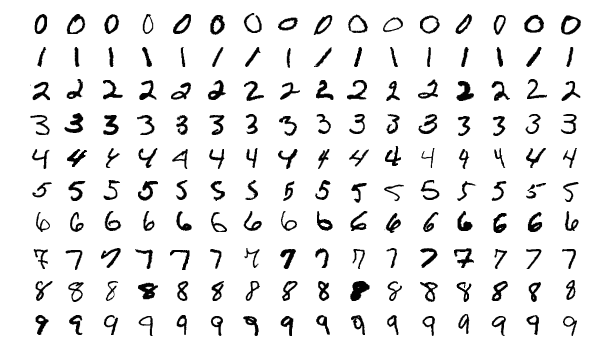

The image size is 1x28x28, it's quite small but I had to spend approximately 30 min to train on it using my laptop GPU (GeForce GTX 970M). 

## Generator

We will start by creating a function ta make a single block for the generator's neural network. Each block include a linear transformation to map to another shape, a batch normalization for stabilization, and finally a non-linear activation function (ReLU) so the output can be transformed in complex ways

In [4]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

Now we can build the Generator. It will take 3 values: the noise vector, image and initial hidden dimentions. Let's start with 5 blocks for simplicity. Beginning with the noise vector, the Generator will apply non-linear transformation via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST dataset). The final layer does not need a normalization or activation function, but does need to be scaled with a sigmoid function. Finally, a forward function takes a noise vector and generates an image of the output dimention using above neural network architecture.

In [6]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)

## Noise

We will generate noise using random numbers from the normal distribution.

In [7]:
def get_noise(n_samples, z_dim, device='cuda'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

## Discriminator

The second component is the Discriminator. We start by creating a function that build neural network for the Discriminator using leaky ReLU activation function to prevent the "dying ReLU" problem. It refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient.

In [8]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope=0.2, inplace=True)
    
    )

Now we can use these blocks to create a Discriminator class, which holds 2 values: the image and hidden dimentions. Let's start by building a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimention tensor) output. This output classifies whether an image is fake or real. Note that we don't need a sigmoid activation function after the output layer because it's included in the Binary Cross Entropy (BCE) loss function. Finally, use the discriminator's neural network in the forward pass function that takes in an image tensor to be classified.

In [9]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)        
        )
    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)

## Trainning

First we need to set parameters:
* criterion: the loss function
* n_epochs: the number of times to iterate through the entire dataset when training
* z_dim: the size of the noise vector
* display_step: how often to visualize the images
* batch_size: the number of images per forward/backward pass
* lr: the learning rate
* device: the device type (GPU or CPU), but here we use GPU to accelerate the training process.

In [11]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size, shuffle=True)

0.2%

100.0%


Extracting .\MNIST\raw\train-images-idx3-ubyte.gz to .\MNIST\raw


102.8%


Extracting .\MNIST\raw\train-labels-idx1-ubyte.gz to .\MNIST\raw




100.0%
112.7%

Extracting .\MNIST\raw\t10k-images-idx3-ubyte.gz to .\MNIST\raw

Extracting .\MNIST\raw\t10k-labels-idx1-ubyte.gz to .\MNIST\raw



Now we can initialize the Generator, Discriminator and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models

In [12]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)

disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before training GAN we need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calcualating the discriminator's loss, we will need to call .detach() on generator result to ensure thet only the discriminator is updated.

In [41]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
     Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    noise = get_noise(num_images, z_dim, device=device)
    fake_image = gen(noise).detach()
    fake_pred = disc(fake_image)
    real_pred = disc(real)
    fake_loss = criterion(fake_pred, torch.zeros_like(fake_pred))
    real_loss = criterion(real_pred, torch.ones_like(real_pred))
    disc_loss = (fake_loss + real_loss) / 2
    return disc_loss

In [44]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
        Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    noise = get_noise(num_images, z_dim, device=device)
    fake_image = gen(noise)
    disc_pred = disc(fake_image)
    gen_loss = criterion(disc_pred, torch.ones_like(disc_pred))
    return gen_loss

Finally, we can put everything together! For each batch, we will need to process the entire dataset in batches. For every batch, we'll need to update the discriminator and generator using their loss.Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess.

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN.

On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
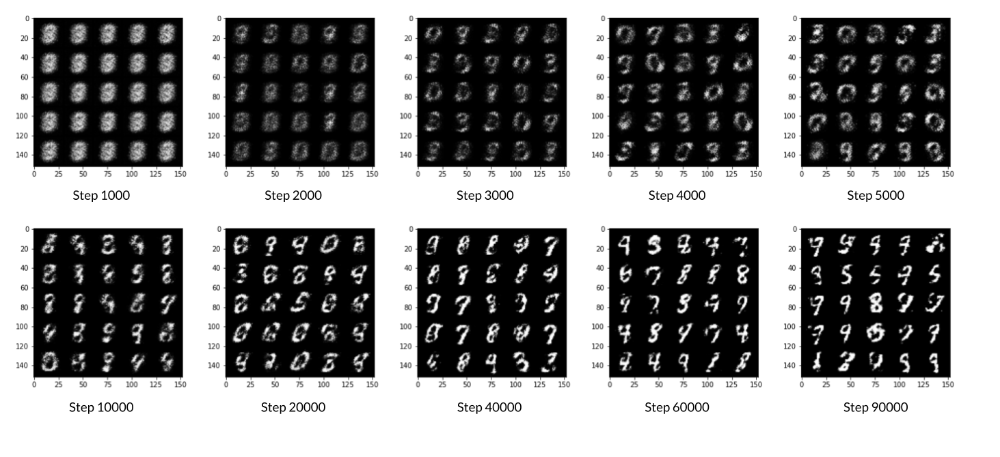

Exception ignored in: <function tqdm.__del__ at 0x000002358FD53DC0>
Traceback (most recent call last):
  File "C:\Anaconda\envs\notebook\lib\site-packages\tqdm\std.py", line 1147, in __del__
    self.close()
  File "C:\Anaconda\envs\notebook\lib\site-packages\tqdm\notebook.py", line 286, in close
    self.disp(bar_style='danger', check_delay=False)
AttributeError: 'tqdm' object has no attribute 'disp'
Exception ignored in: <function tqdm.__del__ at 0x000002358FD53DC0>
Traceback (most recent call last):
  File "C:\Anaconda\envs\notebook\lib\site-packages\tqdm\std.py", line 1147, in __del__
    self.close()
  File "C:\Anaconda\envs\notebook\lib\site-packages\tqdm\notebook.py", line 286, in close
    self.disp(bar_style='danger', check_delay=False)
AttributeError: 'tqdm' object has no attribute 'disp'
Exception ignored in: <function tqdm.__del__ at 0x000002358FD53DC0>
Traceback (most recent call last):
  File "C:\Anaconda\envs\notebook\lib\site-packages\tqdm\std.py", line 1147, in __del__

Step 500: Generator loss: 1.416686136364937, discriminator loss: 0.4139564278125767


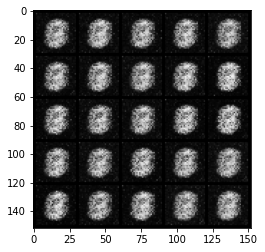

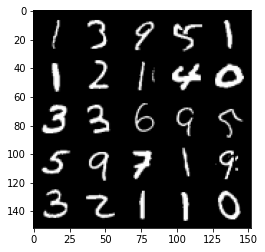

Step 1000: Generator loss: 1.7570449564456938, discriminator loss: 0.2800438861846926


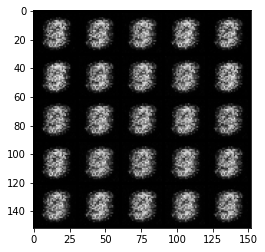

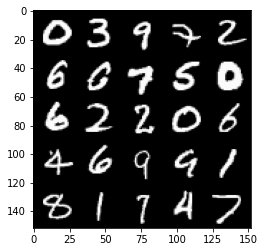

Exception ignored in: <function tqdm.__del__ at 0x000002358FD53DC0>
Traceback (most recent call last):
  File "C:\Anaconda\envs\notebook\lib\site-packages\tqdm\std.py", line 1147, in __del__
    self.close()
  File "C:\Anaconda\envs\notebook\lib\site-packages\tqdm\notebook.py", line 286, in close
    self.disp(bar_style='danger', check_delay=False)
AttributeError: 'tqdm' object has no attribute 'disp'


Step 1500: Generator loss: 2.0931662018299106, discriminator loss: 0.15797599828243244


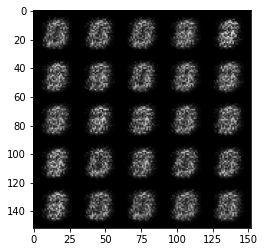

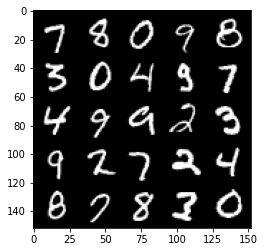

Step 2000: Generator loss: 1.842153088808059, discriminator loss: 0.19220750510692586


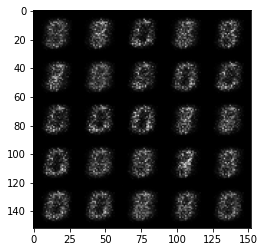

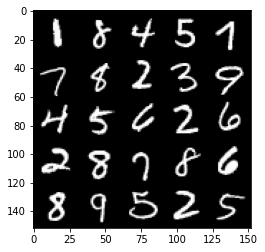

Step 2500: Generator loss: 1.7730991027355212, discriminator loss: 0.18885499787330617


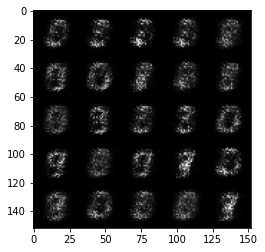

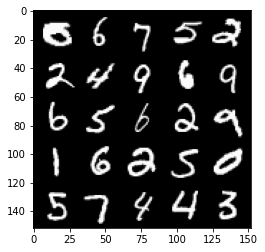

Step 3000: Generator loss: 1.9359562141895315, discriminator loss: 0.17334510931372651


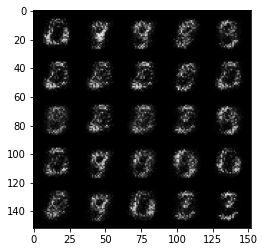

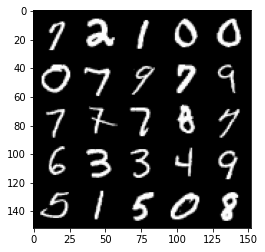

Step 3500: Generator loss: 2.2252231397628783, discriminator loss: 0.1588754536509513


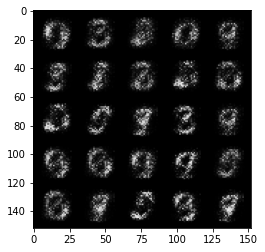

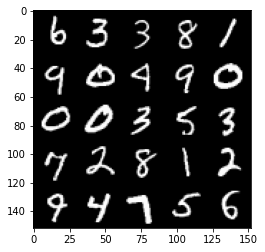

Step 4000: Generator loss: 2.5485835089683544, discriminator loss: 0.14053277178108695


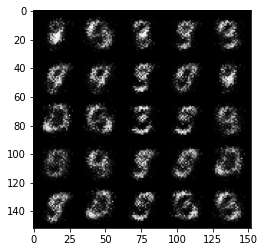

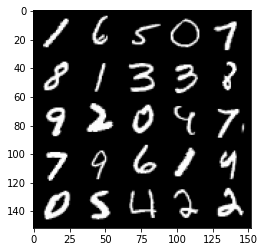

Step 4500: Generator loss: 2.862756628990173, discriminator loss: 0.11505795325338845


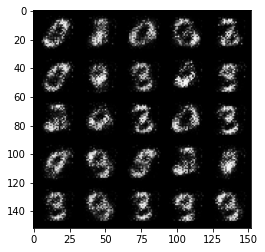

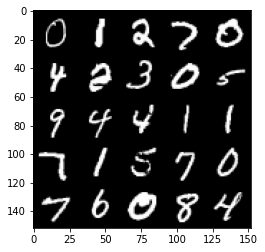

Step 5000: Generator loss: 3.2878696312904405, discriminator loss: 0.0878374952226877


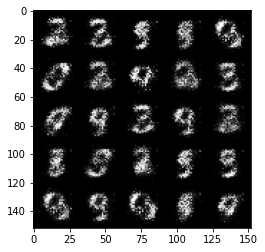

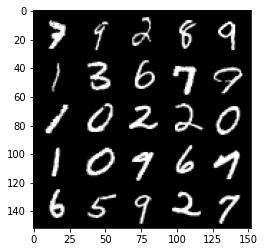

Step 5500: Generator loss: 3.516076411247253, discriminator loss: 0.07742720665782686


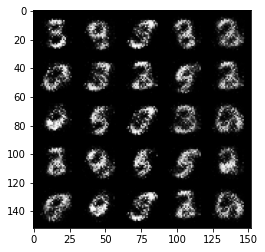

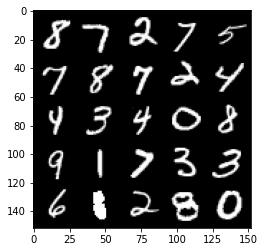

Step 6000: Generator loss: 3.561929532051086, discriminator loss: 0.07839928767830139


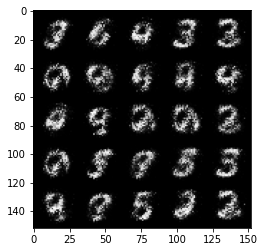

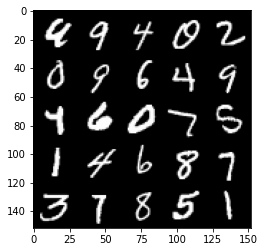

Step 6500: Generator loss: 3.6445483946800237, discriminator loss: 0.0716454365849494


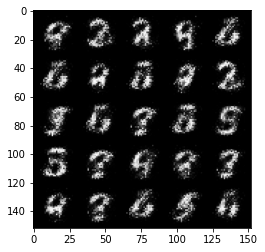

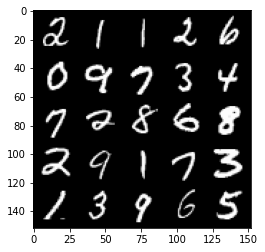

Step 7000: Generator loss: 4.004830513000488, discriminator loss: 0.062466204635798925


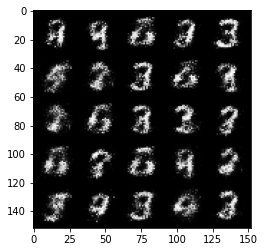

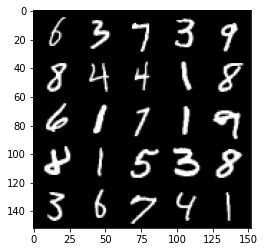

Step 7500: Generator loss: 3.731181622982025, discriminator loss: 0.07215427094697949


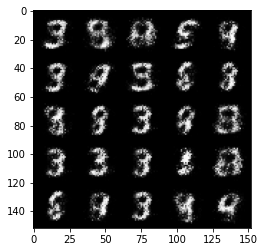

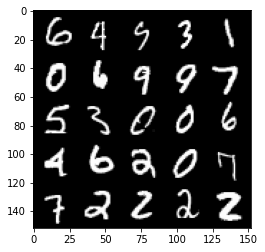

Step 8000: Generator loss: 3.670963582992552, discriminator loss: 0.0708633408024907


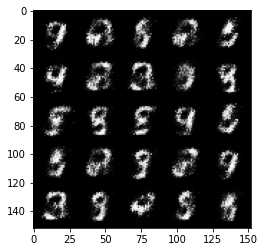

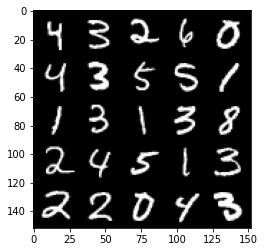

Step 8500: Generator loss: 3.8221540412902812, discriminator loss: 0.0660717688724399


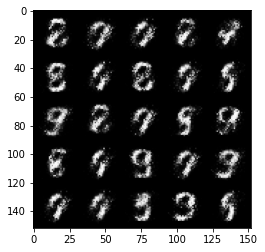

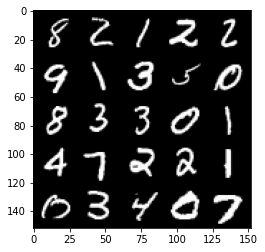

Step 9000: Generator loss: 3.9550433130264286, discriminator loss: 0.06109880340844394


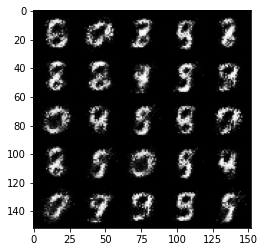

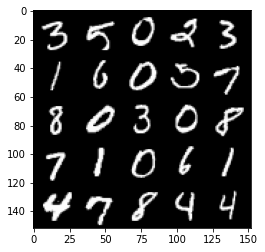

Step 9500: Generator loss: 3.972188769817352, discriminator loss: 0.06864466002956027


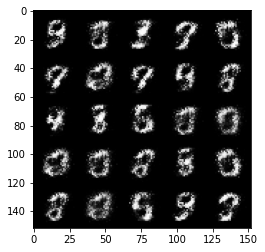

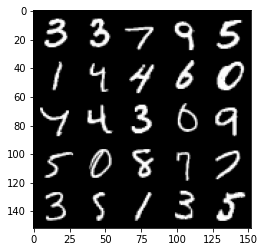

Step 10000: Generator loss: 3.9815974059104904, discriminator loss: 0.07169957646727554


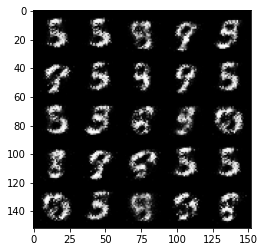

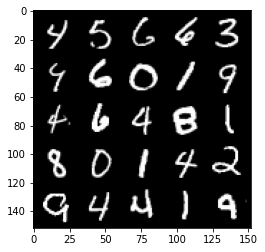

Step 10500: Generator loss: 4.150425881862642, discriminator loss: 0.06375057372450825


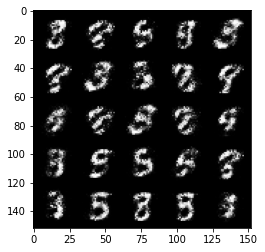

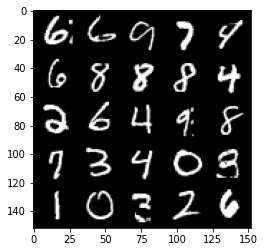

Step 11000: Generator loss: 4.153470949172975, discriminator loss: 0.07214970346540214


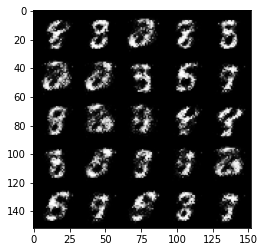

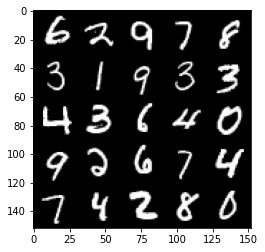

Step 11500: Generator loss: 4.290960114479067, discriminator loss: 0.06795105027407407


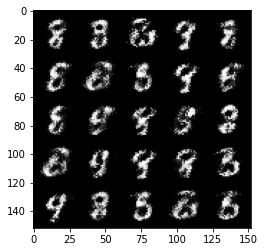

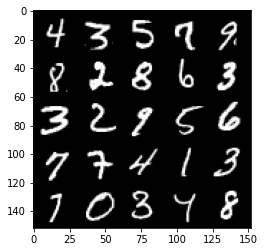

Step 12000: Generator loss: 4.1620888848304745, discriminator loss: 0.0831943031847477


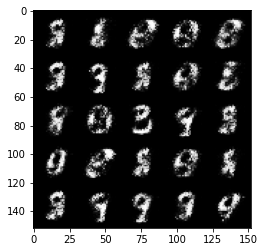

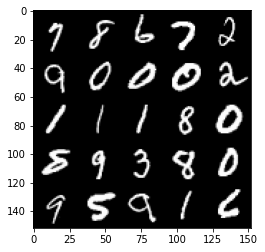

Step 12500: Generator loss: 4.136073256492612, discriminator loss: 0.08239824903756375


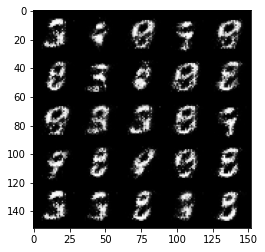

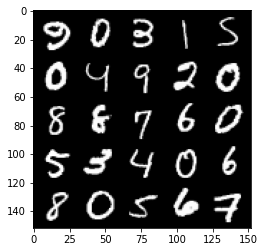

Step 13000: Generator loss: 4.106243263244626, discriminator loss: 0.08370345724374056


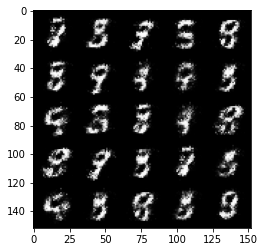

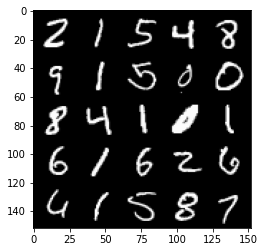

Step 13500: Generator loss: 4.092627443790437, discriminator loss: 0.09686673690378662


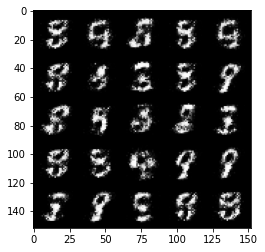

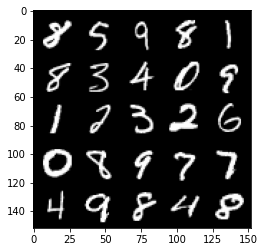

Step 14000: Generator loss: 4.010599000930784, discriminator loss: 0.09438404184579847


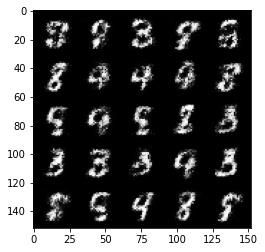

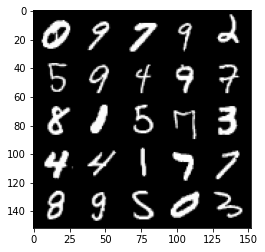

Step 14500: Generator loss: 3.7227901887893657, discriminator loss: 0.11953691031783815


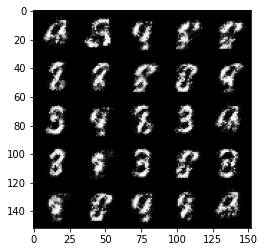

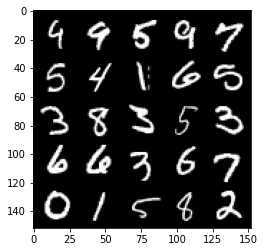

Step 15000: Generator loss: 3.6045333571434055, discriminator loss: 0.11209428381174784


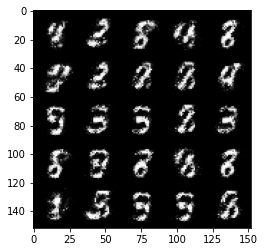

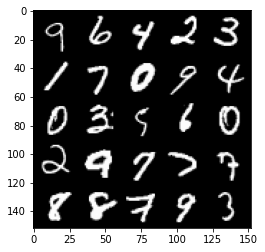

Step 15500: Generator loss: 3.6744872016906744, discriminator loss: 0.10086560311168433


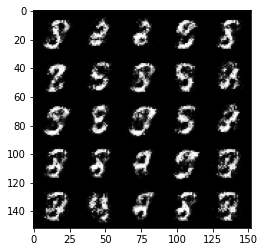

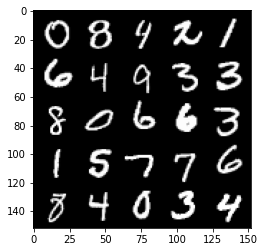

Step 16000: Generator loss: 3.8299434990882886, discriminator loss: 0.10342316745221614


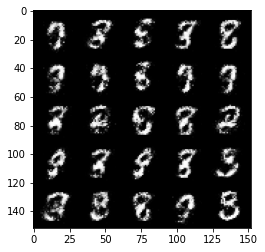

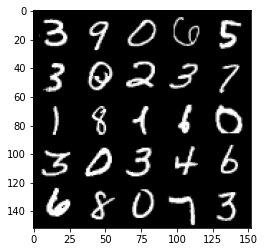

Step 16500: Generator loss: 3.7116880426406875, discriminator loss: 0.10713954170048236


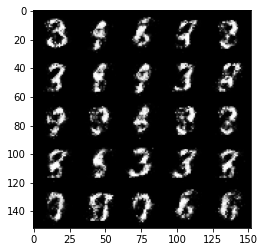

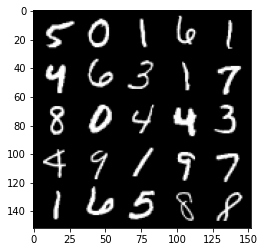

Step 17000: Generator loss: 3.656294547080992, discriminator loss: 0.1273452081456781


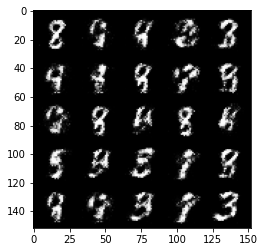

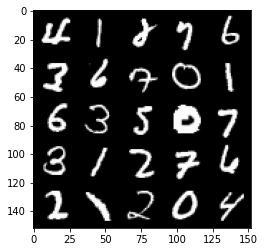

Step 17500: Generator loss: 3.326007126808167, discriminator loss: 0.13519296573847528


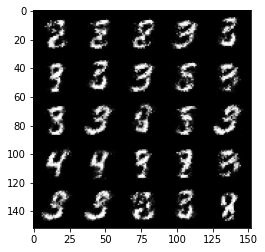

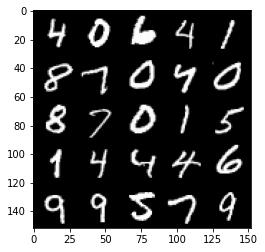

Step 18000: Generator loss: 3.5990613713264477, discriminator loss: 0.12196676661074152


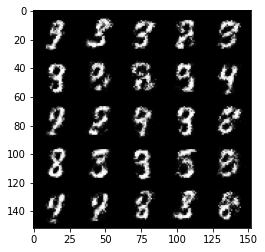

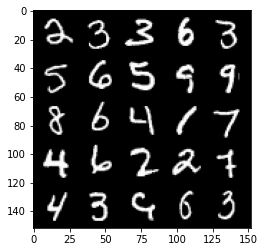

Step 18500: Generator loss: 3.4297735776901246, discriminator loss: 0.1453606642484667


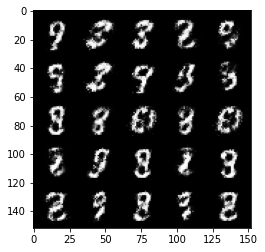

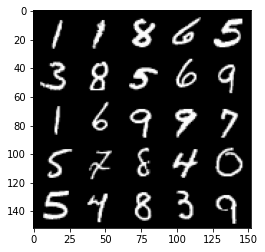

Step 19000: Generator loss: 3.3768423523902893, discriminator loss: 0.14516647297143942


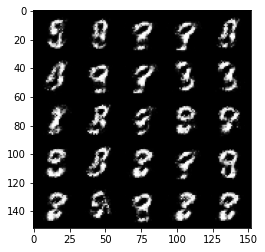

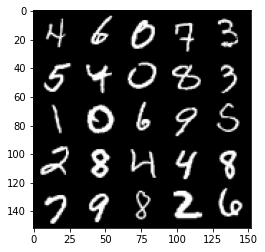

Step 19500: Generator loss: 3.2883461599349957, discriminator loss: 0.14804078009724625


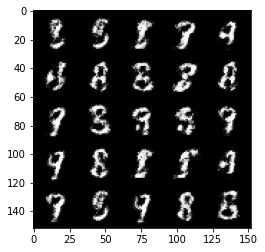

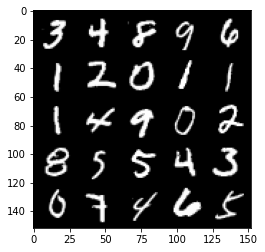

Step 20000: Generator loss: 3.343702514648437, discriminator loss: 0.14066564646363272


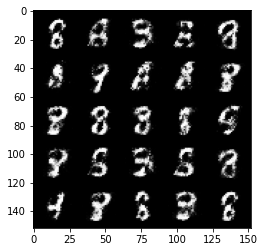

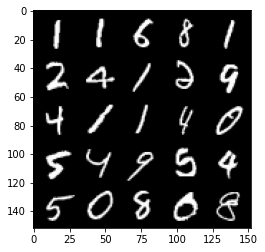

Step 20500: Generator loss: 3.3023208475112904, discriminator loss: 0.15854550108313556


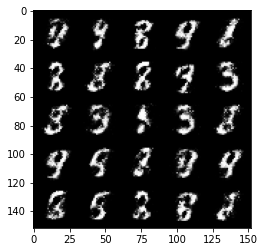

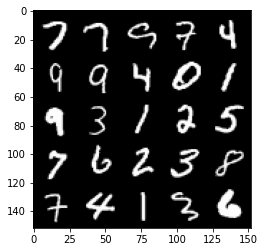

Step 21000: Generator loss: 3.187733181476595, discriminator loss: 0.17147757436335082


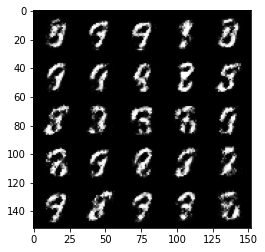

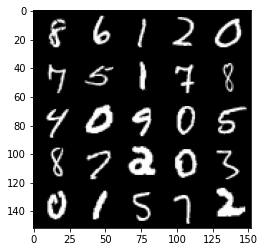

Step 21500: Generator loss: 3.2647023811340303, discriminator loss: 0.16452536942064774


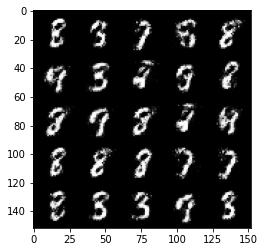

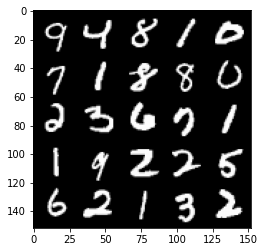

Step 22000: Generator loss: 3.2356963582038842, discriminator loss: 0.16108857102692148


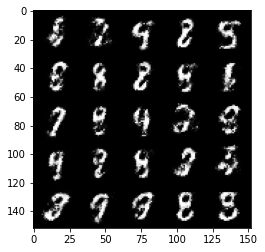

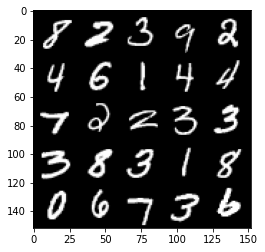

Step 22500: Generator loss: 3.0664324703216512, discriminator loss: 0.17600430084764962


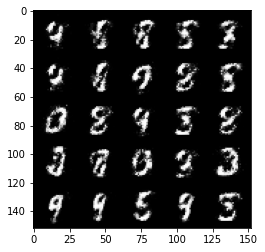

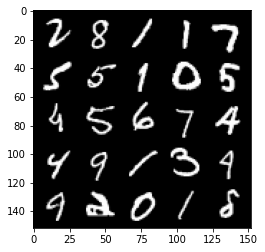

Step 23000: Generator loss: 3.207596281528468, discriminator loss: 0.17797165554761882


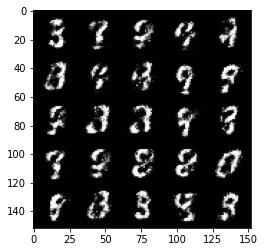

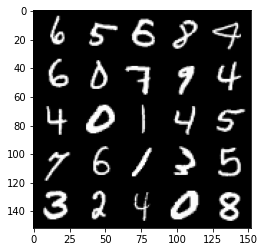

Step 23500: Generator loss: 3.1430902009010295, discriminator loss: 0.17535171058773988


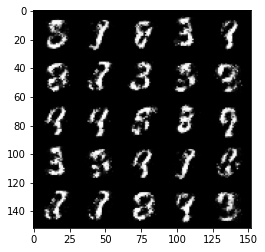

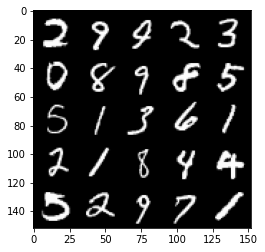

Step 24000: Generator loss: 3.000746404647828, discriminator loss: 0.1903944972157479


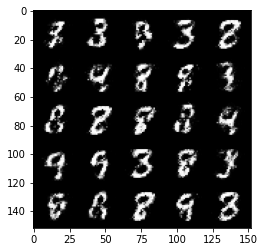

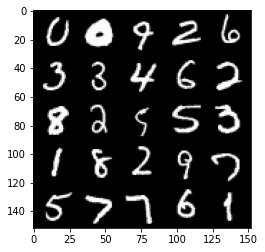

Step 24500: Generator loss: 3.041070083141329, discriminator loss: 0.1788485865592957


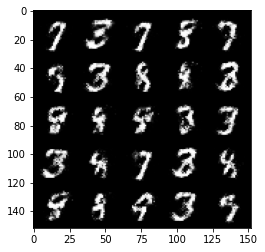

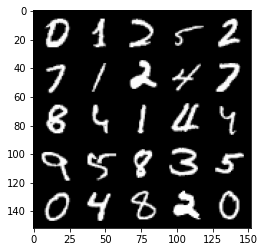

Step 25000: Generator loss: 2.9361324939727798, discriminator loss: 0.1983247549831866


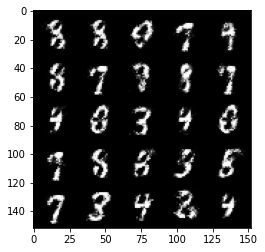

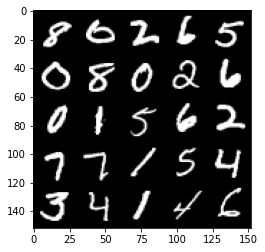

Step 25500: Generator loss: 2.954669821739197, discriminator loss: 0.18791701614856718


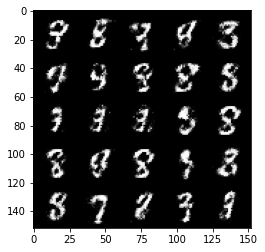

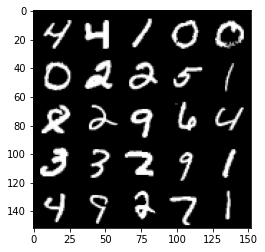

Step 26000: Generator loss: 2.8772315020561194, discriminator loss: 0.2021798837780954


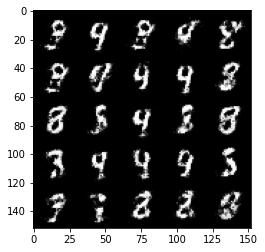

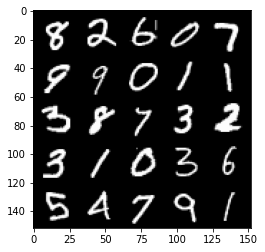

Step 26500: Generator loss: 2.859168125152588, discriminator loss: 0.2188626298308372


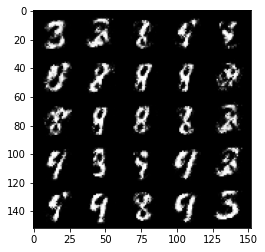

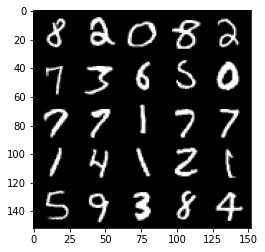

Step 27000: Generator loss: 2.773445941925051, discriminator loss: 0.21921281826496122


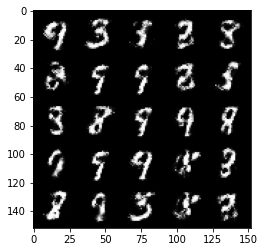

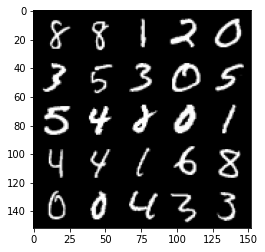

Step 27500: Generator loss: 2.605027594089508, discriminator loss: 0.2628471132218834


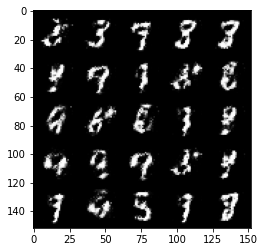

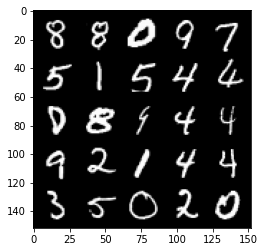

Step 28000: Generator loss: 2.6156490669250485, discriminator loss: 0.2389835883975027


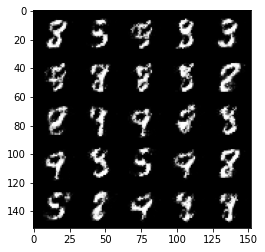

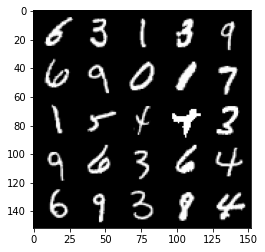

Step 28500: Generator loss: 2.6142645912170424, discriminator loss: 0.2278927045166494


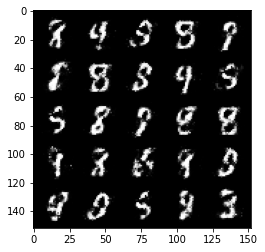

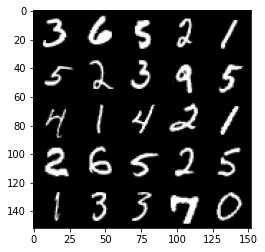

Step 29000: Generator loss: 2.561663120269774, discriminator loss: 0.24645086747407904


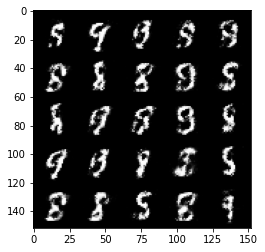

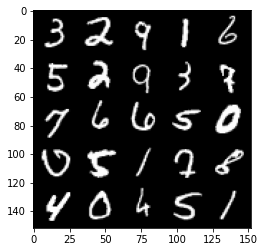

Step 29500: Generator loss: 2.625777133941649, discriminator loss: 0.21747606959938995


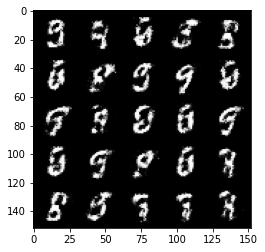

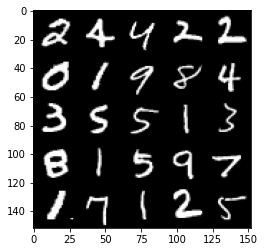

Step 30000: Generator loss: 2.6909871406555195, discriminator loss: 0.21475105021893975


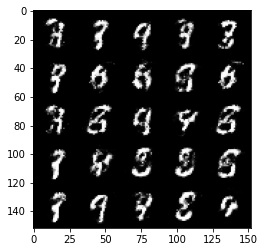

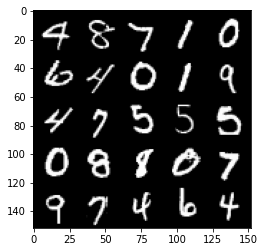

Step 30500: Generator loss: 2.6127698116302494, discriminator loss: 0.23205114942789062


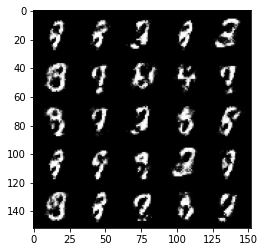

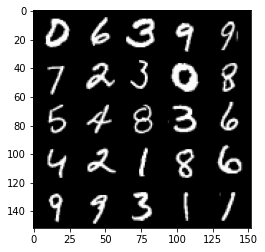

Step 31000: Generator loss: 2.5562361099720006, discriminator loss: 0.24402134644985224


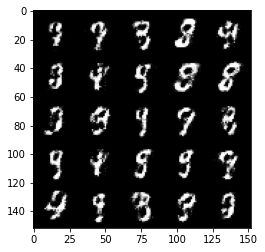

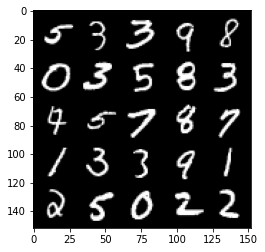

Step 31500: Generator loss: 2.473630922317506, discriminator loss: 0.25299315235018704


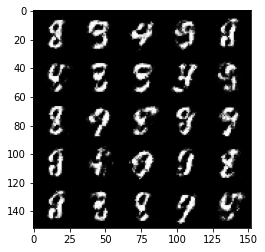

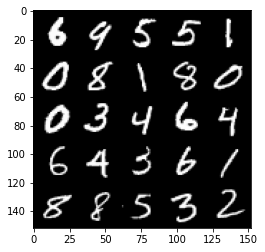

Step 32000: Generator loss: 2.566148754596709, discriminator loss: 0.2352839564979075


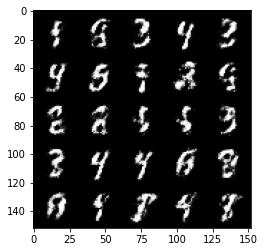

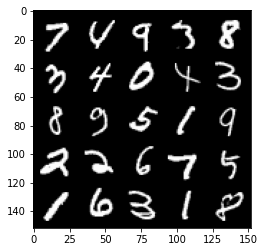

Step 32500: Generator loss: 2.556236160278322, discriminator loss: 0.23920829299092286


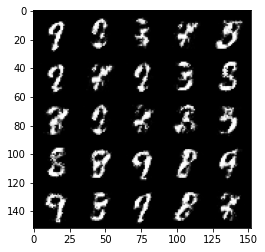

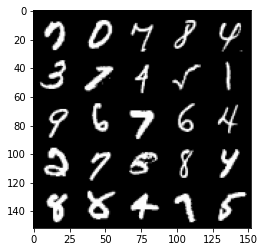

Step 33000: Generator loss: 2.4619376883506785, discriminator loss: 0.2505950581431391


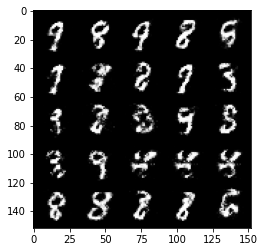

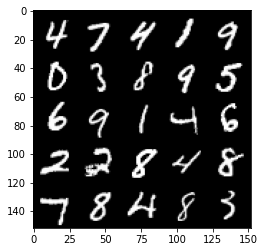

Step 33500: Generator loss: 2.5172868590354915, discriminator loss: 0.24177354601025572


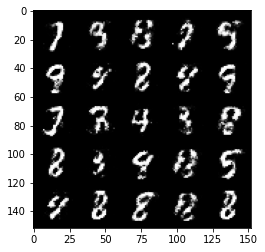

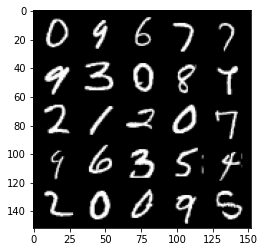

Step 34000: Generator loss: 2.6376446681022685, discriminator loss: 0.22444172489643138


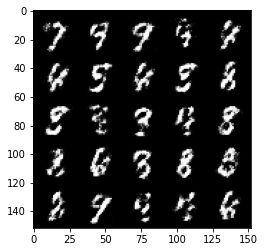

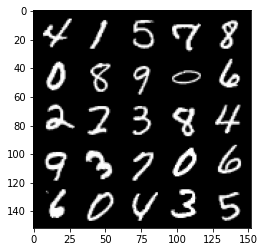

Step 34500: Generator loss: 2.4505964286327337, discriminator loss: 0.2516588611006735


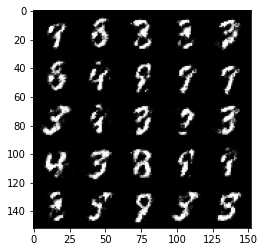

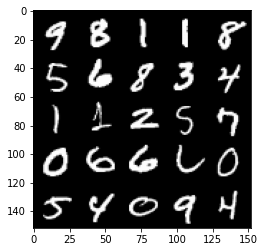

Step 35000: Generator loss: 2.5936094293594345, discriminator loss: 0.21632679897546764


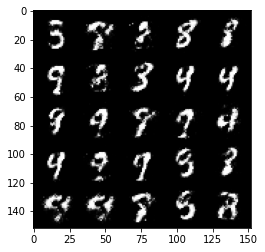

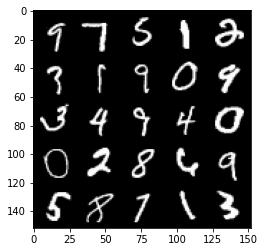

Step 35500: Generator loss: 2.5537577562332157, discriminator loss: 0.23280849575996396


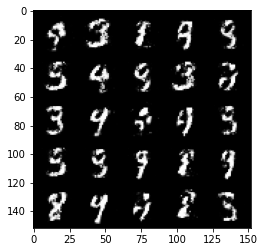

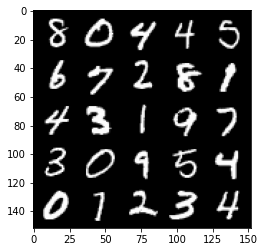

Step 36000: Generator loss: 2.5141948504447957, discriminator loss: 0.2367813372015954


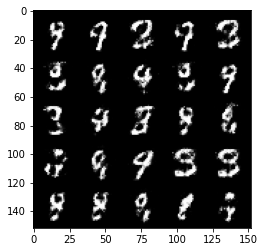

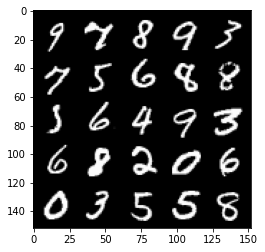

Step 36500: Generator loss: 2.4730378873348235, discriminator loss: 0.24568078067898771


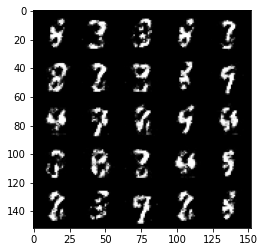

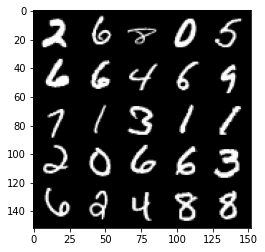

Step 37000: Generator loss: 2.5483946089744554, discriminator loss: 0.2525849622786045


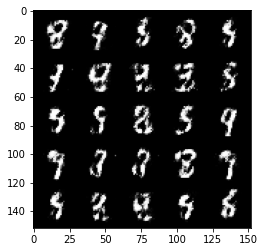

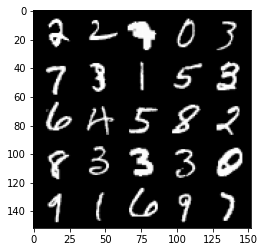

Step 37500: Generator loss: 2.366733738422393, discriminator loss: 0.273965499341488


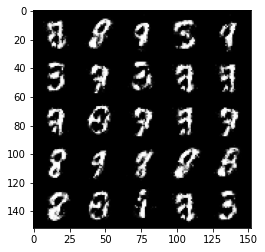

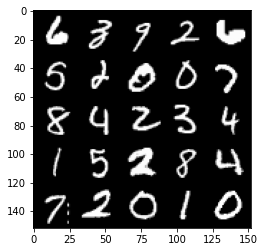

Step 38000: Generator loss: 2.2722669067382806, discriminator loss: 0.28511014062166223


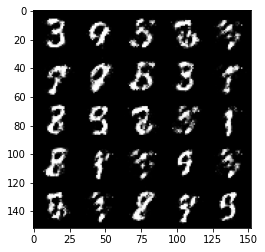

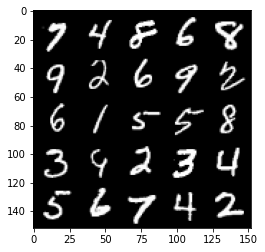

Step 38500: Generator loss: 2.3906165394783, discriminator loss: 0.2666389203965664


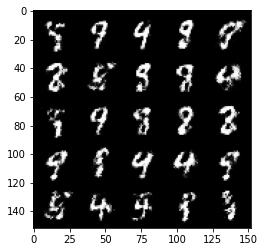

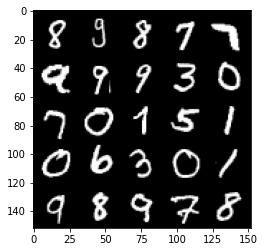

Step 39000: Generator loss: 2.2491512954235087, discriminator loss: 0.2942839741110804


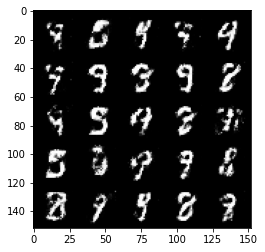

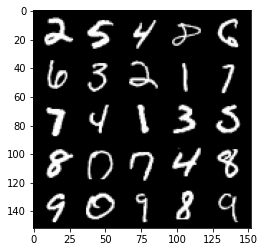

Step 39500: Generator loss: 2.2875316629409803, discriminator loss: 0.27510217565298073


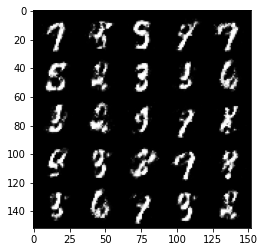

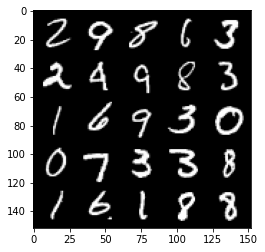

Step 40000: Generator loss: 2.3515210855007145, discriminator loss: 0.2646127746701238


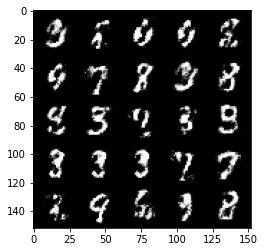

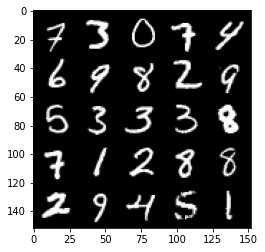

Step 40500: Generator loss: 2.281212184429168, discriminator loss: 0.2776024384200573


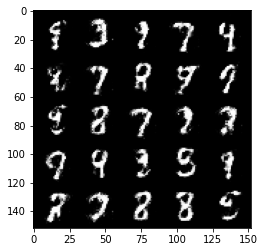

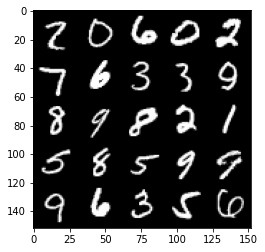

Step 41000: Generator loss: 2.167355516433716, discriminator loss: 0.29837845975160615


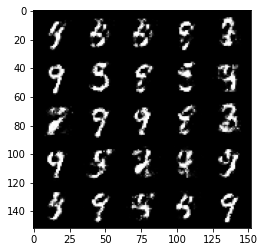

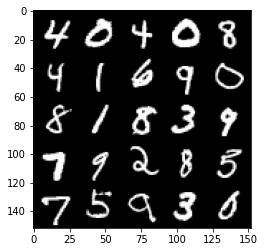

Step 41500: Generator loss: 2.278327476978303, discriminator loss: 0.27669312480092045


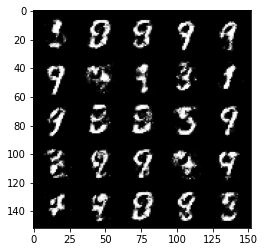

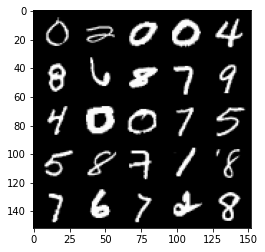

Step 42000: Generator loss: 2.1217868127822888, discriminator loss: 0.3061077779233458


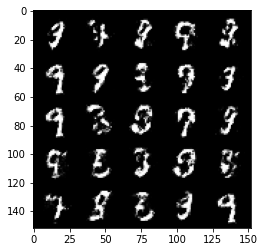

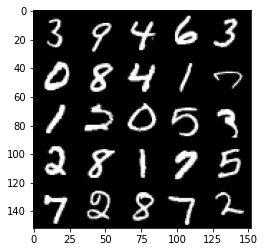

Step 42500: Generator loss: 2.2394931197166428, discriminator loss: 0.2819078011214733


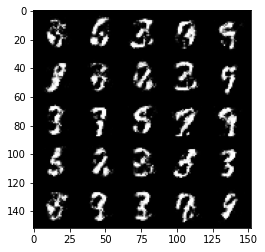

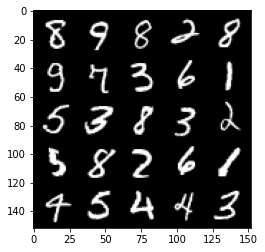

Step 43000: Generator loss: 2.2838196475505836, discriminator loss: 0.2826661896407604


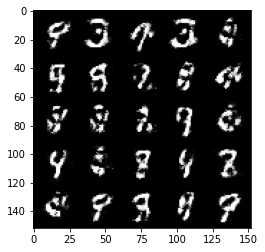

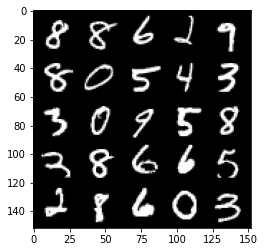

Step 43500: Generator loss: 2.2162480802536018, discriminator loss: 0.2911127738952639


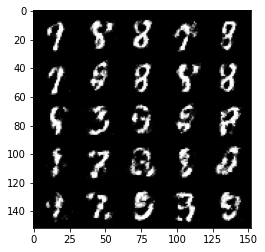

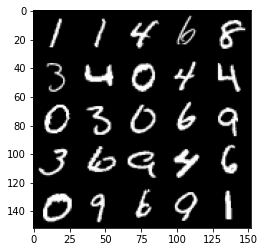

Step 44000: Generator loss: 2.1894955530166627, discriminator loss: 0.30060137957334526


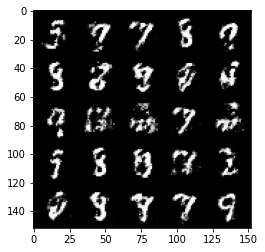

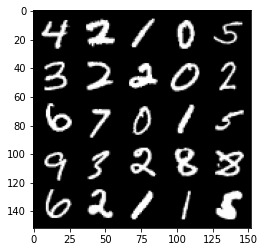

Step 44500: Generator loss: 2.0994384438991562, discriminator loss: 0.3237157231271269


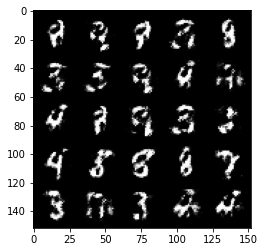

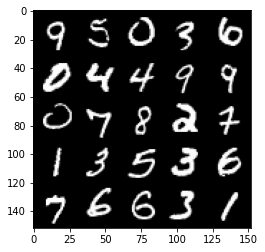

Step 45000: Generator loss: 2.051070799112319, discriminator loss: 0.3228586483001711


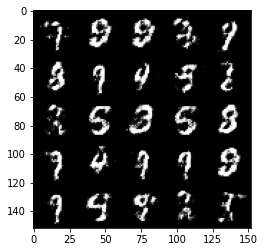

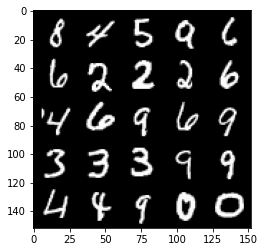

Step 45500: Generator loss: 1.954862054347993, discriminator loss: 0.3447151808440684


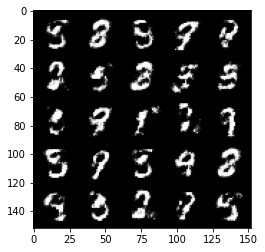

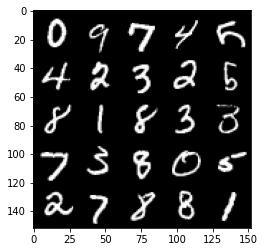

Step 46000: Generator loss: 2.071854615926744, discriminator loss: 0.3022973856329918


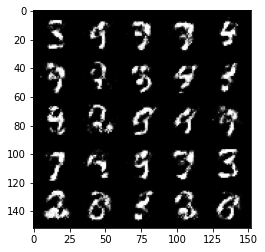

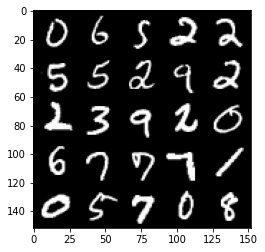

Step 46500: Generator loss: 2.1270796935558316, discriminator loss: 0.30506589201092704


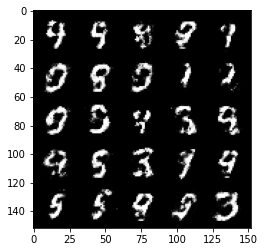

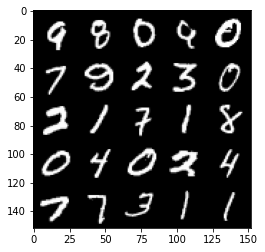

Step 47000: Generator loss: 2.1392847943305973, discriminator loss: 0.2930723848640921


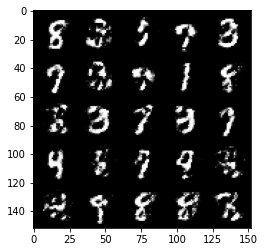

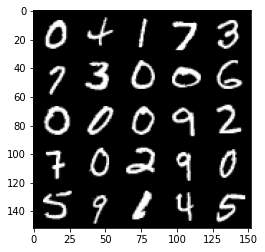

Step 47500: Generator loss: 2.162728688240053, discriminator loss: 0.28992428368330003


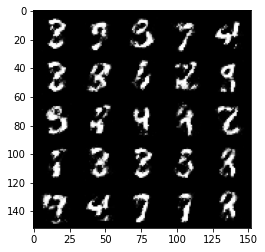

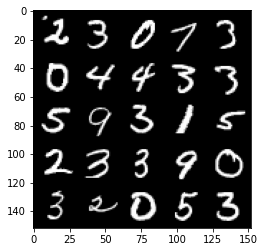

Step 48000: Generator loss: 1.9909076781272903, discriminator loss: 0.3236680960059163


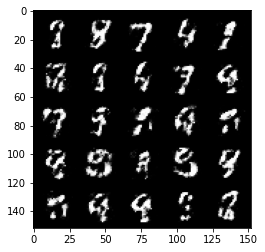

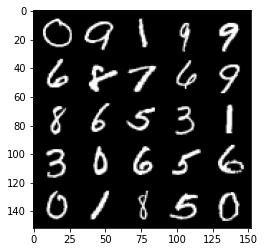

Step 48500: Generator loss: 2.05987986755371, discriminator loss: 0.30635705718398104


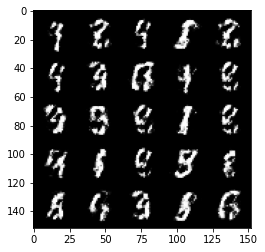

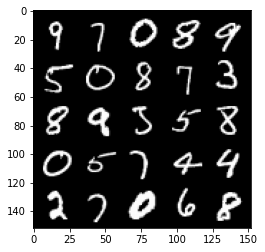

Step 49000: Generator loss: 2.065355386257173, discriminator loss: 0.3112279882729052


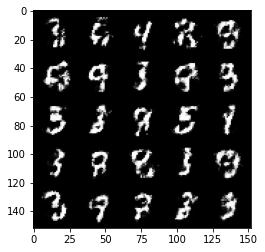

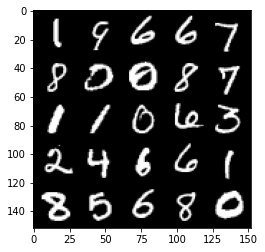

Step 49500: Generator loss: 2.015043236255646, discriminator loss: 0.3318746249377728


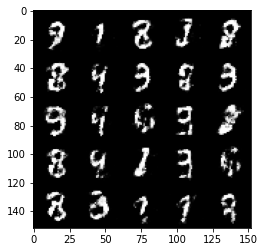

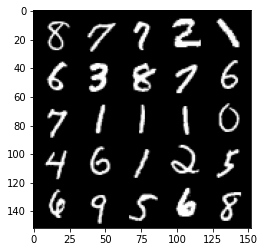

Step 50000: Generator loss: 1.9142929239273065, discriminator loss: 0.33471328109502824


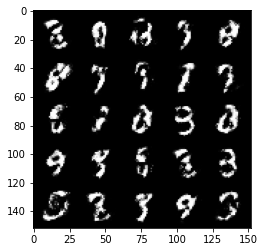

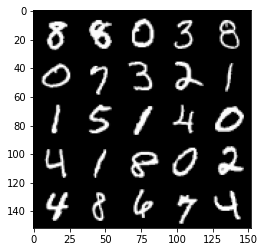

Step 50500: Generator loss: 2.0380168437957766, discriminator loss: 0.31012153771519657


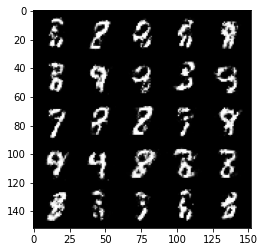

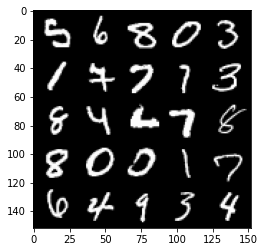

Step 51000: Generator loss: 2.050735299348833, discriminator loss: 0.3114033969938756


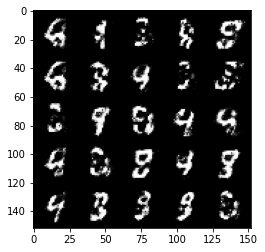

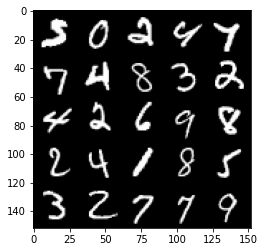

Step 51500: Generator loss: 1.9097264344692233, discriminator loss: 0.3460301038026808


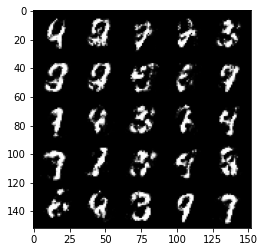

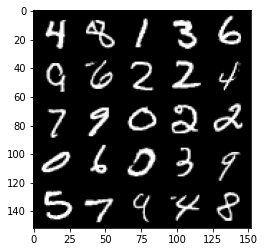

Step 52000: Generator loss: 1.9513511972427378, discriminator loss: 0.32972306653857236


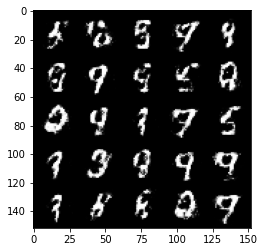

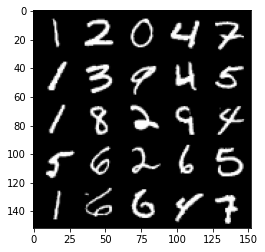

Step 52500: Generator loss: 2.058916973829268, discriminator loss: 0.3186259498298165


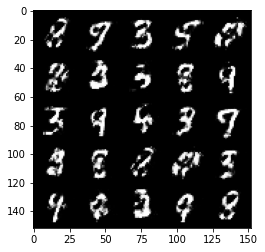

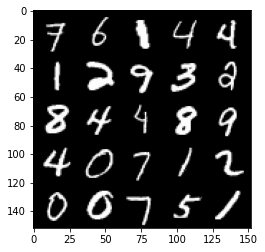

Step 53000: Generator loss: 1.9890719230175014, discriminator loss: 0.3376137073636051


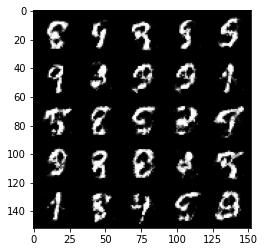

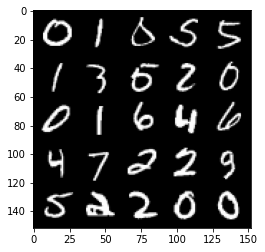

Step 53500: Generator loss: 2.0853163974285125, discriminator loss: 0.31214013350009895


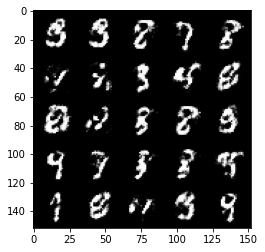

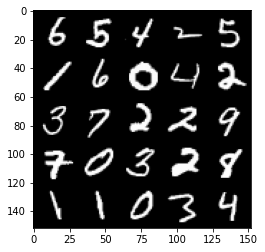

Step 54000: Generator loss: 2.1329395856857305, discriminator loss: 0.2969986661374569


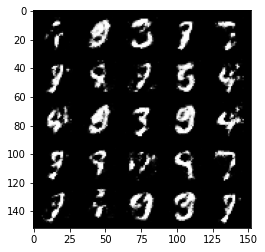

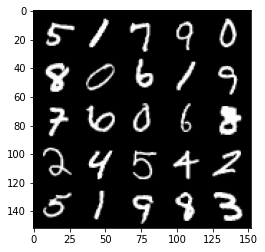

Step 54500: Generator loss: 1.9942175815105438, discriminator loss: 0.339459980726242


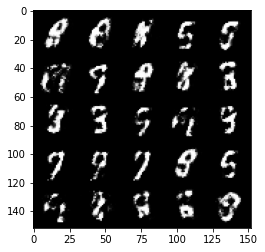

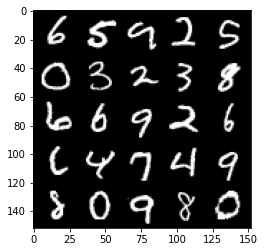

Step 55000: Generator loss: 1.945967815160751, discriminator loss: 0.33135734221339214


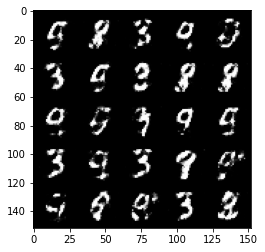

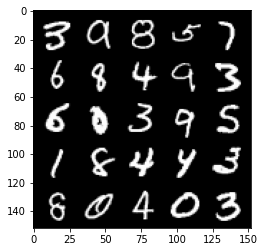

Step 55500: Generator loss: 2.046070764541626, discriminator loss: 0.3193117363154886


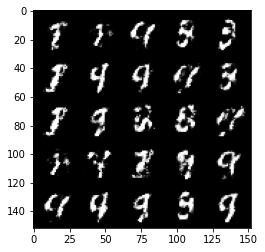

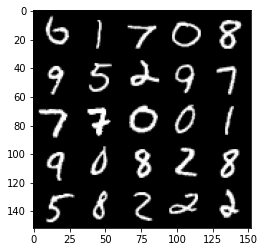

Step 56000: Generator loss: 1.8130245006084436, discriminator loss: 0.38000139653682713


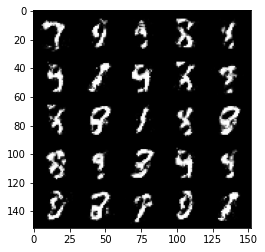

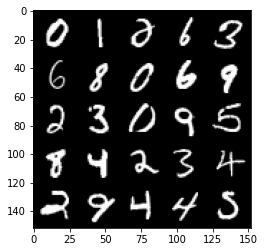

Step 56500: Generator loss: 1.835461888790129, discriminator loss: 0.3623638995289802


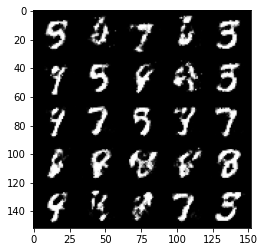

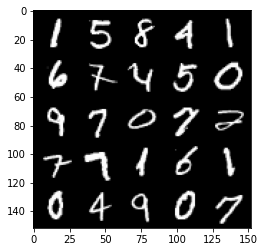

Step 57000: Generator loss: 1.8144714720249195, discriminator loss: 0.35474616956710797


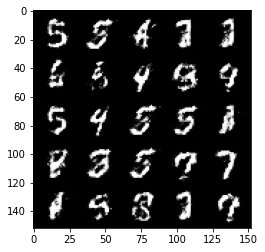

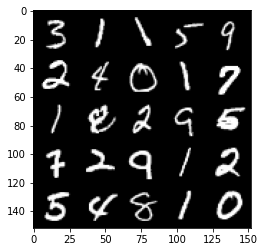

Step 57500: Generator loss: 1.9110565974712368, discriminator loss: 0.33363661837577807


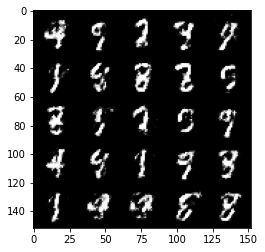

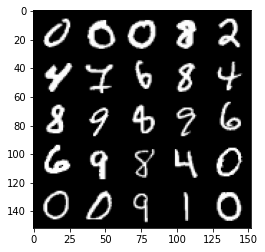

Step 58000: Generator loss: 1.9012197463512421, discriminator loss: 0.3455558049678804


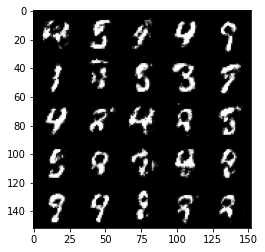

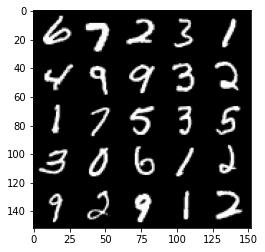

Step 58500: Generator loss: 1.8215297391414644, discriminator loss: 0.37463748639822003


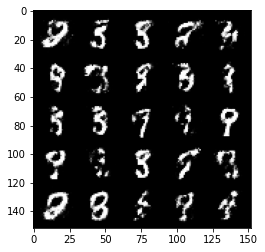

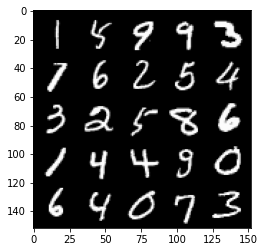

Step 59000: Generator loss: 1.7730450026988969, discriminator loss: 0.36313692736625675


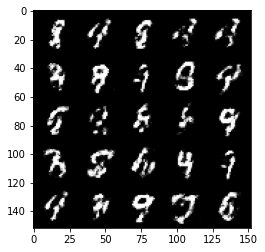

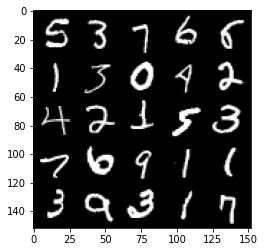

Step 59500: Generator loss: 1.6895588519573224, discriminator loss: 0.40112149578332895


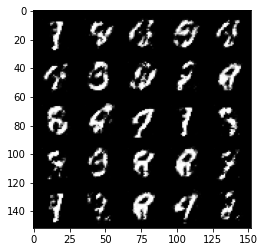

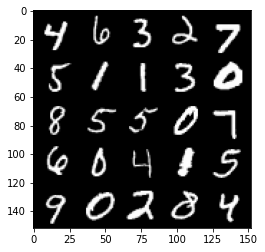

Step 60000: Generator loss: 1.7481154150962819, discriminator loss: 0.3729556895494461


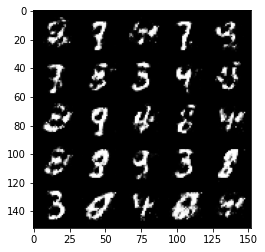

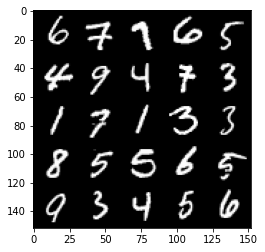

Step 60500: Generator loss: 1.804210712432863, discriminator loss: 0.3634629811346535


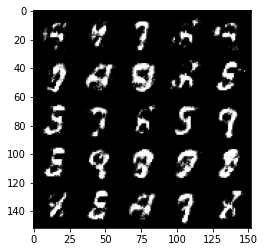

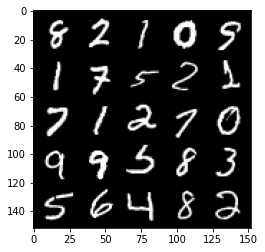

Step 61000: Generator loss: 1.7241249723434462, discriminator loss: 0.39587710922956465


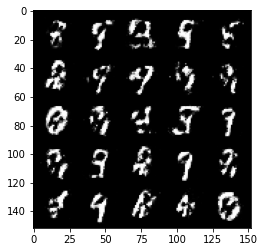

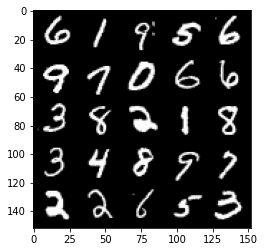

Step 61500: Generator loss: 1.6898389611244218, discriminator loss: 0.390796991586685


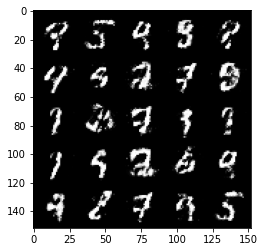

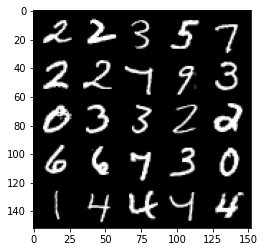

Step 62000: Generator loss: 1.845305125713348, discriminator loss: 0.34492113840579974


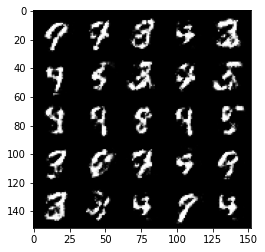

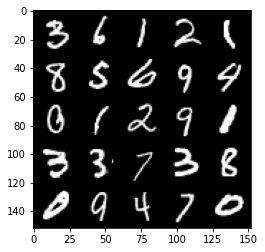

Step 62500: Generator loss: 1.7439418528079982, discriminator loss: 0.3815842151045799


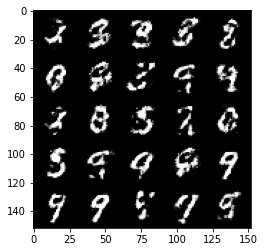

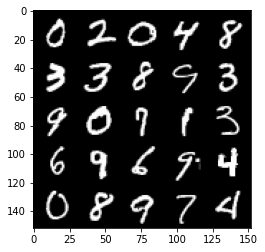

Step 63000: Generator loss: 1.703547247409822, discriminator loss: 0.3859247491359713


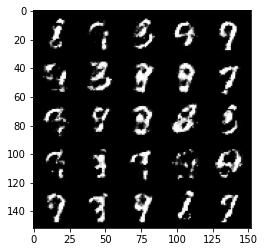

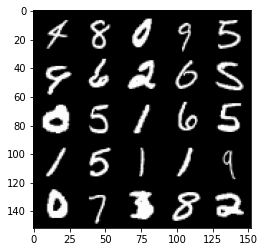

Step 63500: Generator loss: 1.723451196432116, discriminator loss: 0.36862697744369516


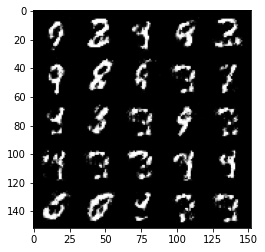

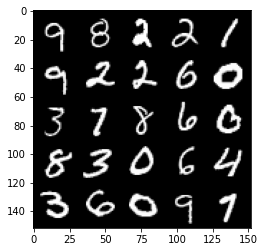

Step 64000: Generator loss: 1.7219834876060474, discriminator loss: 0.38313613784313194


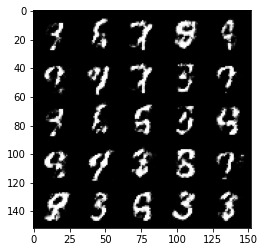

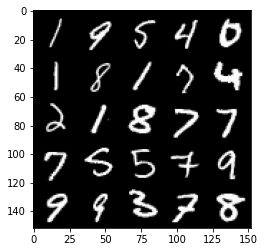

Step 64500: Generator loss: 1.6607312161922425, discriminator loss: 0.3908403063416484


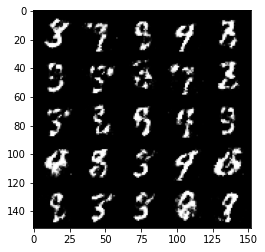

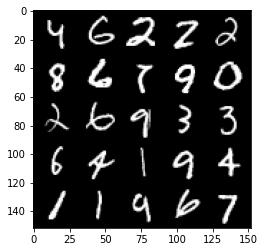

Step 65000: Generator loss: 1.6620640132427202, discriminator loss: 0.39358278763294174


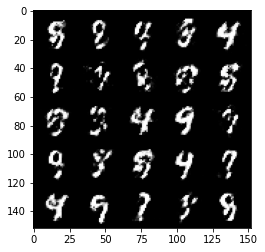

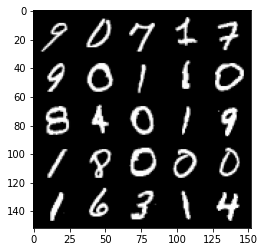

Step 65500: Generator loss: 1.697159401655197, discriminator loss: 0.3865588644146921


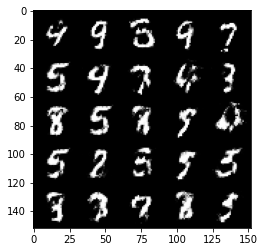

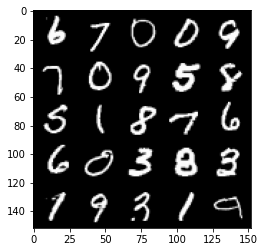

Step 66000: Generator loss: 1.6511518845558157, discriminator loss: 0.3875730301141737


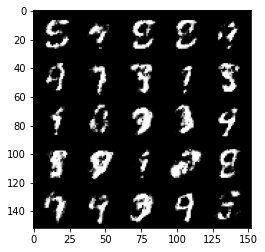

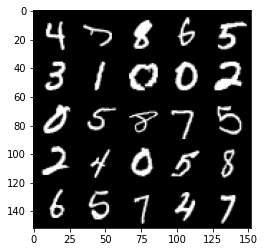

Step 66500: Generator loss: 1.783658972501755, discriminator loss: 0.3569244674742222


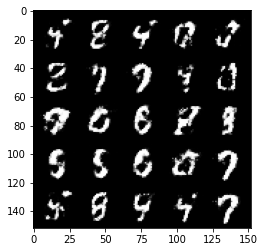

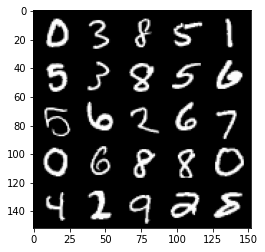

Step 67000: Generator loss: 1.743538836002352, discriminator loss: 0.38361057639122


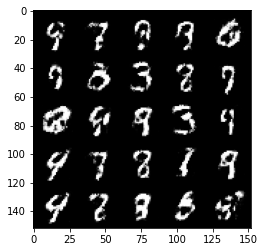

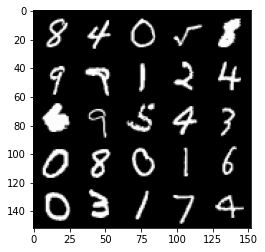

Step 67500: Generator loss: 1.7425212490558633, discriminator loss: 0.3736689900159838


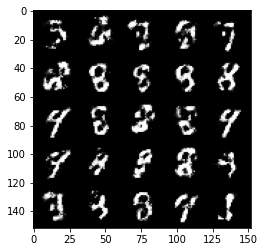

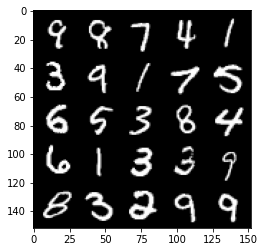

Step 68000: Generator loss: 1.7907260563373542, discriminator loss: 0.3690104727745055


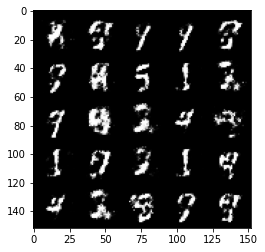

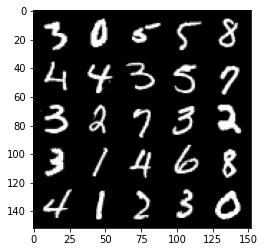

Step 68500: Generator loss: 1.7364812757968897, discriminator loss: 0.36762871566414834


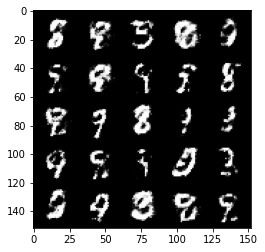

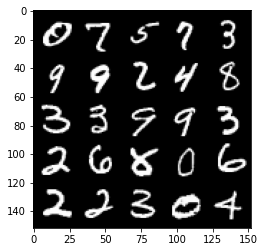

Step 69000: Generator loss: 1.831231432676315, discriminator loss: 0.3479098109900953


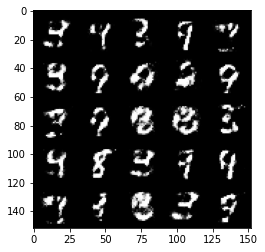

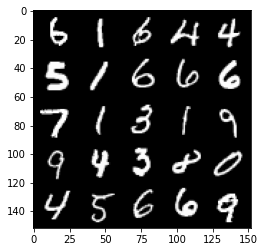

Step 69500: Generator loss: 1.8339159772396076, discriminator loss: 0.3617726945877071


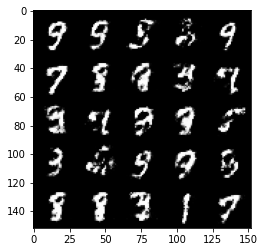

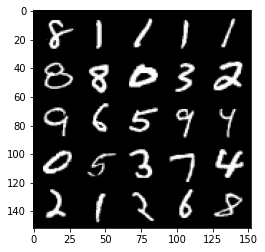

Step 70000: Generator loss: 1.7896354980468736, discriminator loss: 0.36288049829006247


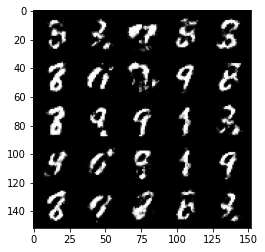

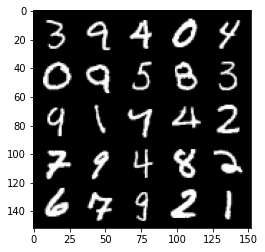

Step 70500: Generator loss: 1.7523249652385722, discriminator loss: 0.3696233539581296


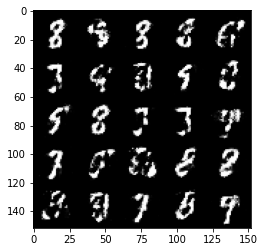

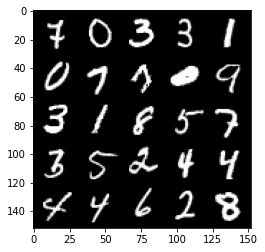

Step 71000: Generator loss: 1.7380519263744352, discriminator loss: 0.38501597869396176


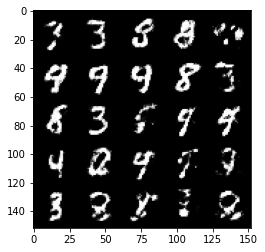

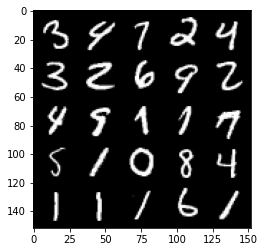

Step 71500: Generator loss: 1.5987283804416659, discriminator loss: 0.41723924499750104


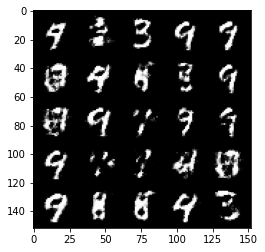

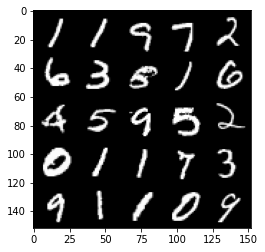

Step 72000: Generator loss: 1.5383829519748686, discriminator loss: 0.42285215699672674


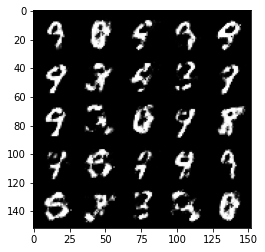

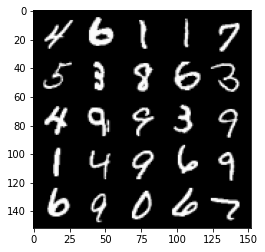

Step 72500: Generator loss: 1.6054216387271882, discriminator loss: 0.3968358820676801


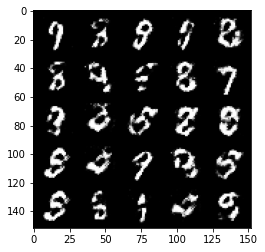

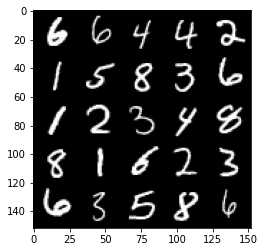

Step 73000: Generator loss: 1.6294644339084616, discriminator loss: 0.3921398793458941


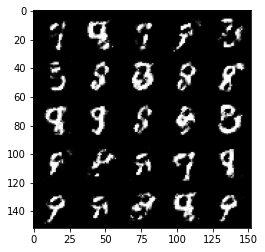

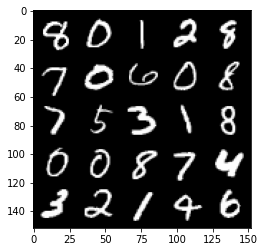

Step 73500: Generator loss: 1.656210165500641, discriminator loss: 0.3878070234656336


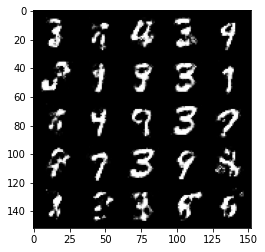

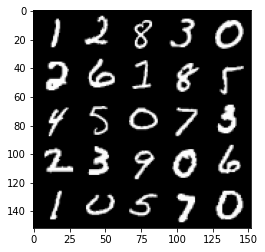

Step 74000: Generator loss: 1.6366088430881498, discriminator loss: 0.4049086989760397


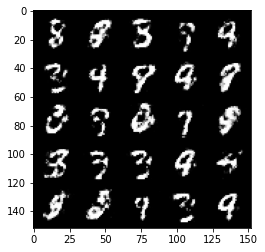

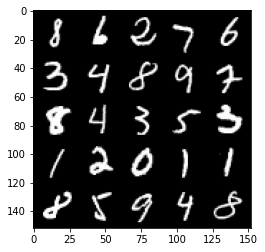

Step 74500: Generator loss: 1.543127418994903, discriminator loss: 0.4421246712803842


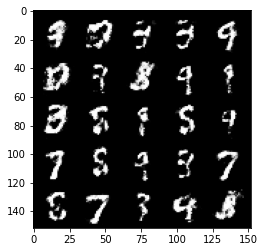

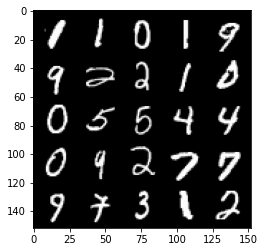

Step 75000: Generator loss: 1.561387333869935, discriminator loss: 0.41264009553194037


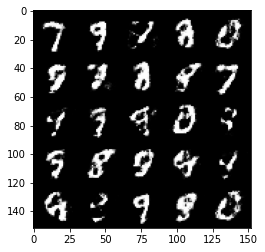

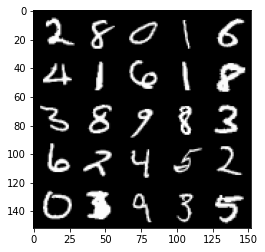

Step 75500: Generator loss: 1.5288041744232157, discriminator loss: 0.4214740589857103


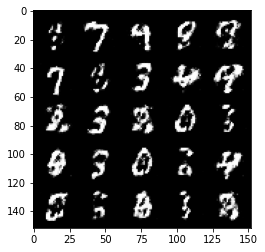

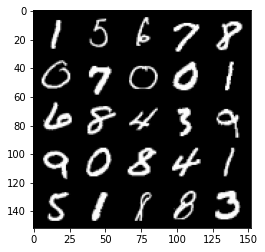

Step 76000: Generator loss: 1.6029053132534028, discriminator loss: 0.389763723373413


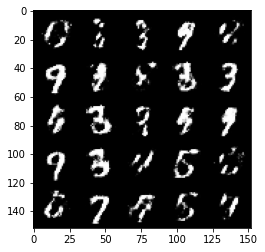

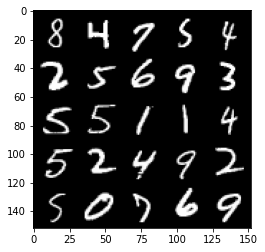

Step 76500: Generator loss: 1.5691192352771752, discriminator loss: 0.41517838293313936


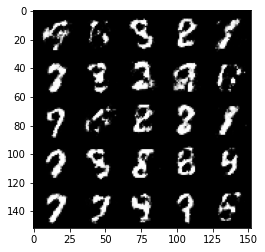

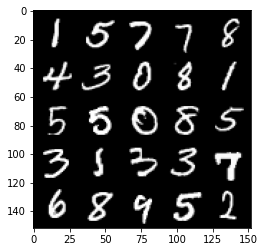

Step 77000: Generator loss: 1.5189823720455176, discriminator loss: 0.4342490141391754


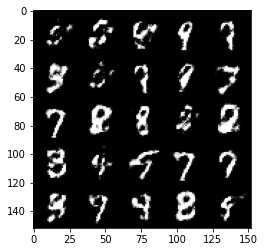

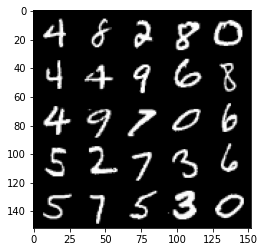

Step 77500: Generator loss: 1.4304655332565304, discriminator loss: 0.46419249498844123


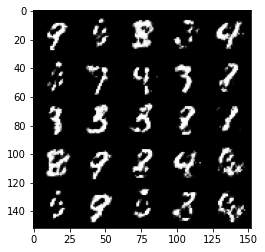

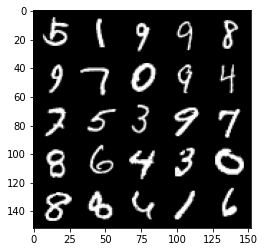

Step 78000: Generator loss: 1.5141599686145781, discriminator loss: 0.423744172871113


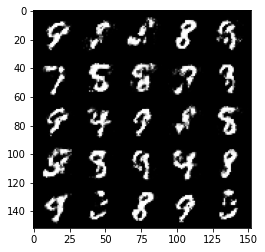

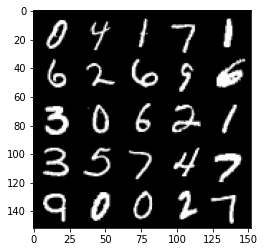

Step 78500: Generator loss: 1.5019679698944093, discriminator loss: 0.43045028936862917


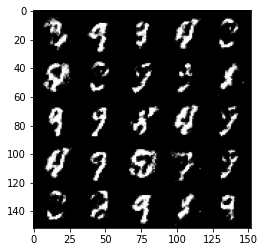

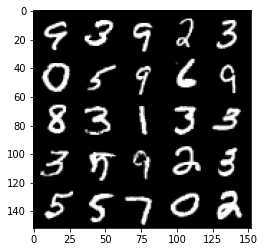

Step 79000: Generator loss: 1.5112879903316507, discriminator loss: 0.43670804506540295


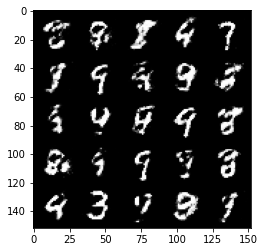

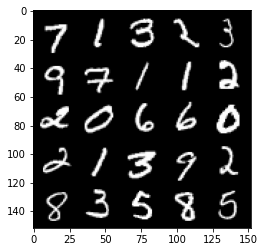

Step 79500: Generator loss: 1.5810339686870574, discriminator loss: 0.39779240733385063


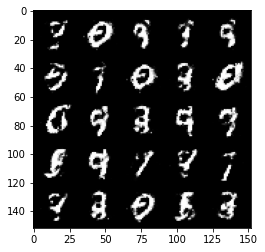

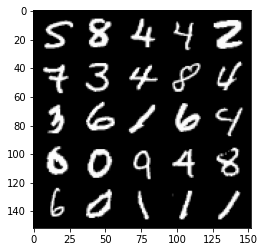

Step 80000: Generator loss: 1.5328672320842733, discriminator loss: 0.42337787610292443


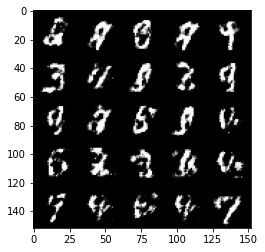

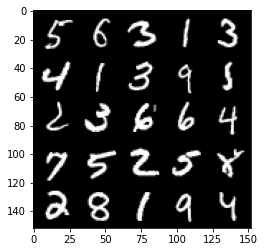

Step 80500: Generator loss: 1.5969783315658574, discriminator loss: 0.40190458250045796


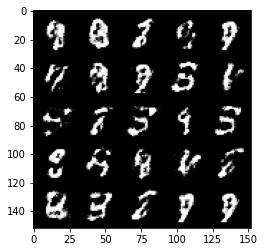

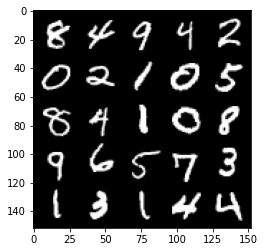

Step 81000: Generator loss: 1.5967458064556108, discriminator loss: 0.408007051885128


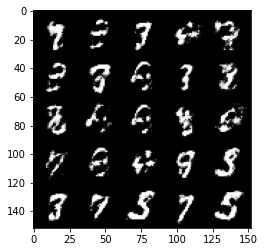

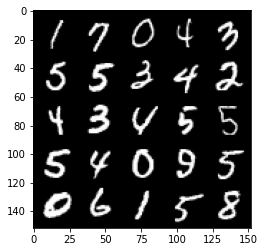

Step 81500: Generator loss: 1.5906415033340449, discriminator loss: 0.40654868966341007


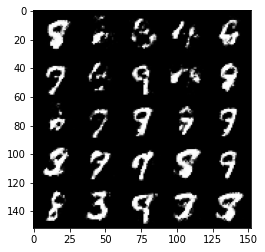

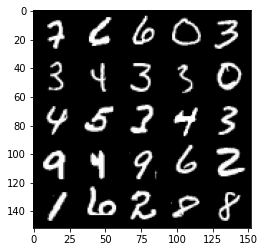

Step 82000: Generator loss: 1.543753252506256, discriminator loss: 0.42045688235759726


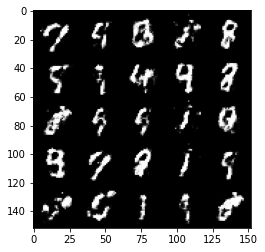

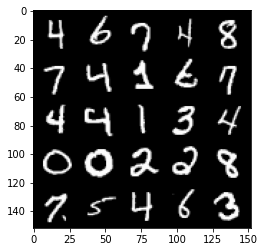

Step 82500: Generator loss: 1.6276696190834061, discriminator loss: 0.4008820986747738


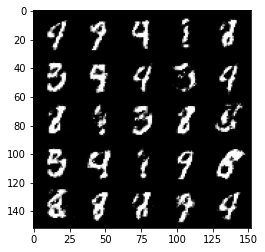

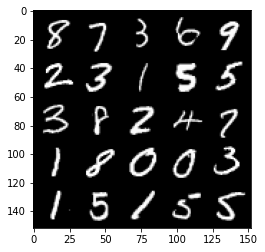

Step 83000: Generator loss: 1.5522410135269165, discriminator loss: 0.41527773797512024


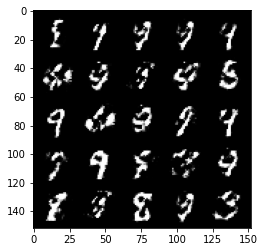

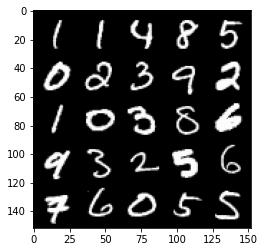

Step 83500: Generator loss: 1.4709332480430601, discriminator loss: 0.434053457438946


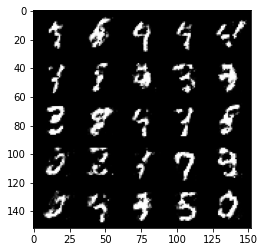

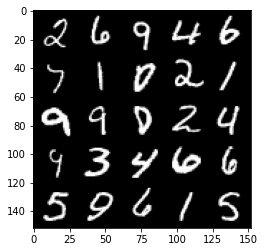

Step 84000: Generator loss: 1.4718057193756091, discriminator loss: 0.42857092767953897


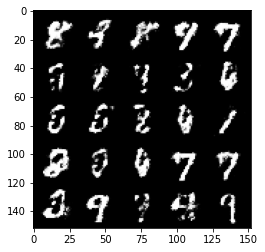

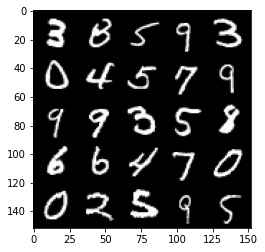

Step 84500: Generator loss: 1.4708971376419055, discriminator loss: 0.43172650367021564


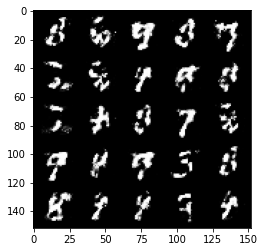

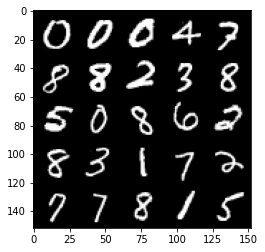

Step 85000: Generator loss: 1.4498263344764712, discriminator loss: 0.4379720242023471


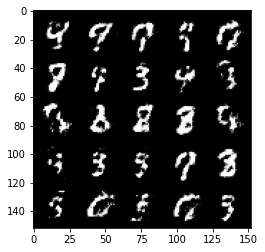

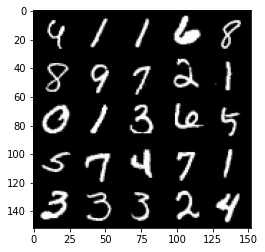

Step 85500: Generator loss: 1.4961600735187526, discriminator loss: 0.43179669302701956


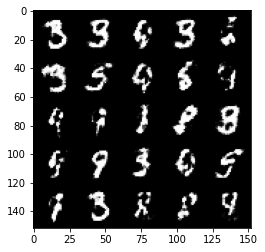

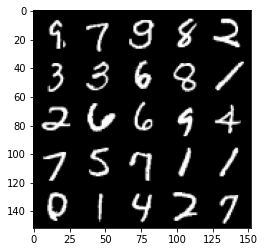

Step 86000: Generator loss: 1.4918529725074772, discriminator loss: 0.44682243293523705


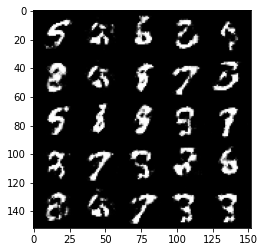

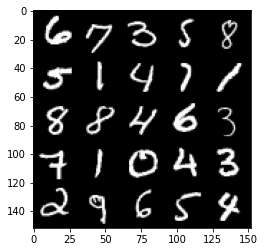

Step 86500: Generator loss: 1.5716347796916956, discriminator loss: 0.4101987913846971


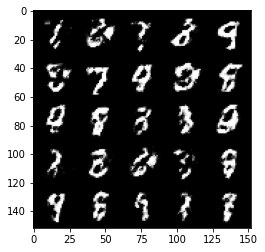

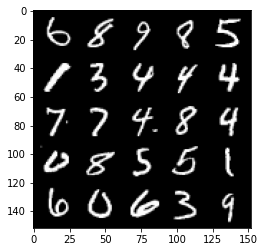

Step 87000: Generator loss: 1.4462881507873544, discriminator loss: 0.4443931962847715


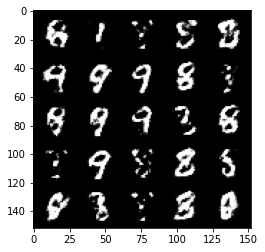

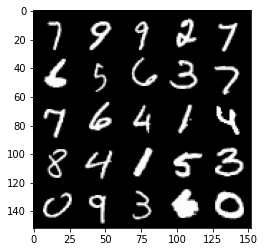

Step 87500: Generator loss: 1.4254424710273745, discriminator loss: 0.439814420044422


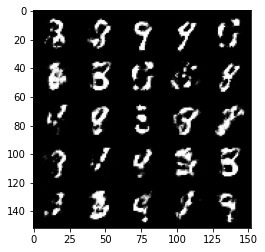

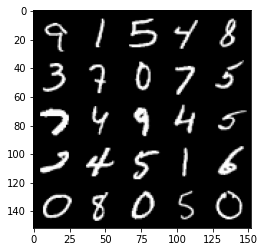

Step 88000: Generator loss: 1.4002623617649064, discriminator loss: 0.44966186469793307


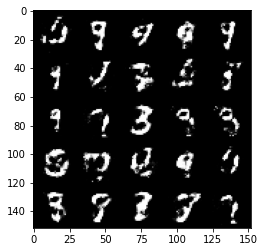

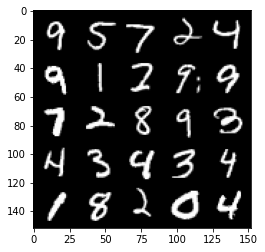

Step 88500: Generator loss: 1.4466503069400776, discriminator loss: 0.43414455735683477


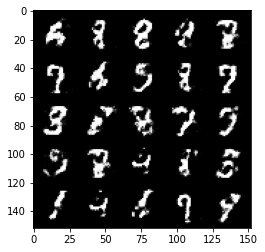

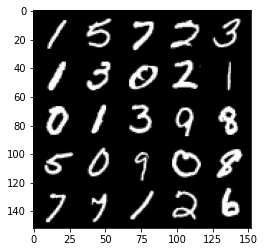

Step 89000: Generator loss: 1.416966394662856, discriminator loss: 0.45296750092506455


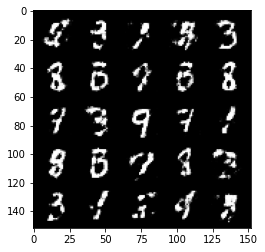

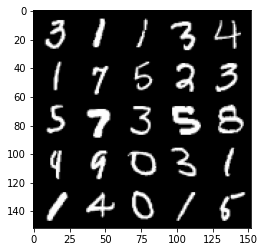

Step 89500: Generator loss: 1.4162447965145117, discriminator loss: 0.44706598383188234


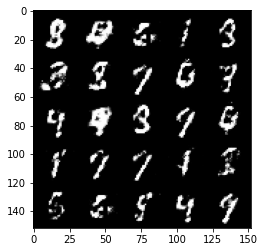

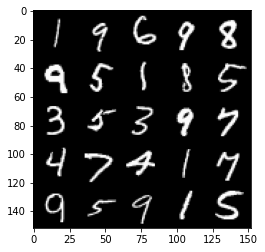

Step 90000: Generator loss: 1.3087957918643942, discriminator loss: 0.4754615685939788


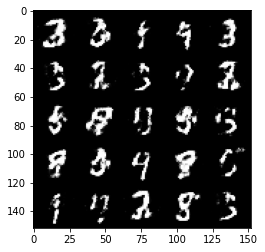

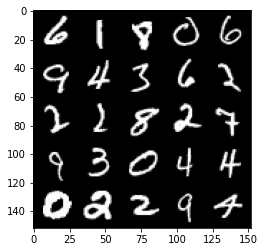

Step 90500: Generator loss: 1.3659582879543322, discriminator loss: 0.4487688226103783


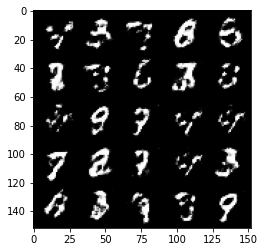

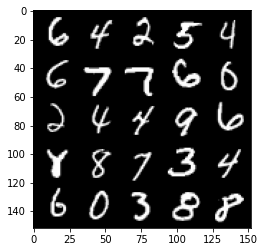

Step 91000: Generator loss: 1.3897679326534271, discriminator loss: 0.4437341812253001


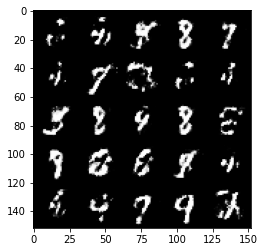

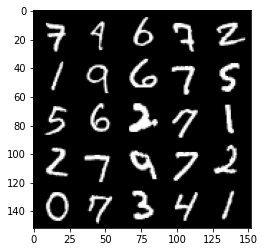

Step 91500: Generator loss: 1.4057048339843752, discriminator loss: 0.4515193821787835


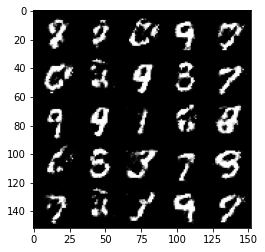

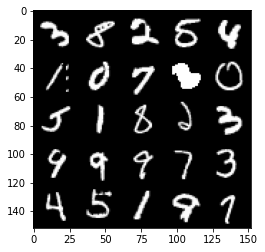

Step 92000: Generator loss: 1.4102025747299183, discriminator loss: 0.4550565363764765


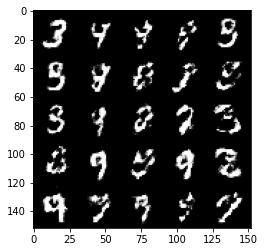

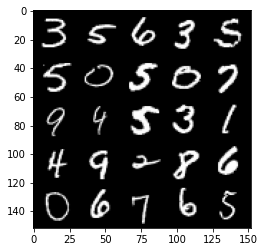

Step 92500: Generator loss: 1.3359097123146058, discriminator loss: 0.4687670496702196


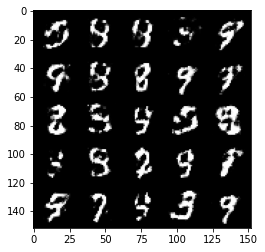

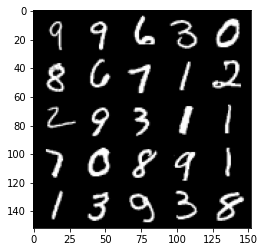

Step 93000: Generator loss: 1.3483290781974808, discriminator loss: 0.4715328690409659


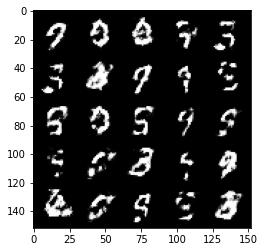

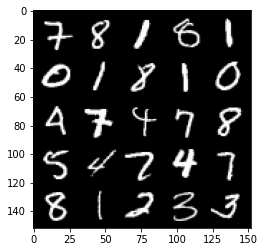

Step 93500: Generator loss: 1.2840708315372464, discriminator loss: 0.47712619924545296


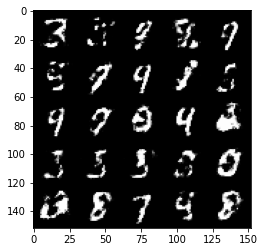

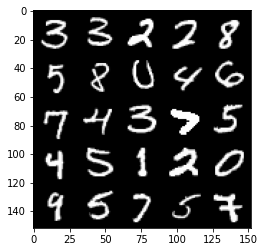

In [45]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0

for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in dataloader:
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        ### Update generator ###
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
